<div style="background-color: red; padding: 10px; border-radius: 10px; text-align: center;">
  <span style="color: white; font-size: 25px; font-weight: bold;">
      Intel Image Classification using CNN
    
   </span>
</div>


<span style="color: Blue; font-size: 18px; font-weight: bold;">
      By : Ahmed Almohamdy
    
   </span>


________

 <span style="color: red; font-size: 18px; font-weight: bold;">
    
   Building Model using CNN by tensorflow and Keras to Classify 14k+ Image to 6 category
    
   </span>


**Data link** : https://www.kaggle.com/puneet6060/intel-image-classification



<div style="background-color: green; padding: 10px; border-radius: 10px; text-align: center;">
  <span style="color: white; font-size: 15px; font-weight: bold;">
      Importing
    
   </span>
</div>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from sklearn.metrics import confusion_matrix



# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [2]:
trainpath = '/kaggle/input/intel-image-classification/seg_train/'
testpath = '/kaggle/input/intel-image-classification/seg_test/'
predpath = '/kaggle/input/intel-image-classification/seg_pred/'

# **Open Folders**

In [3]:
for folder in  os.listdir(trainpath + 'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2512 in folder mountain
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2274 in folder sea
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier


In [4]:
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


_____
now for prediction folder

In [5]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


# Checking Images

**now we need to heck the images sizes , to know how they looks like**

**since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back**

In [6]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5} # tell me this in data description

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

In [7]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

<span style="color: red; font-size: 15px; font-weight: bold;">
      most is (150 * 150 * 3 )
    
   </span>


In [8]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

In [9]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
Name: count, dtype: int64

# Reading Images

**now it's time to read all images & convert it into arrays**
**let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training**

In [10]:
# new size (100,100,3)
s = 100

# **Now to read all pictues in six categories in training folder,using OpenCV to resize it**

In [11]:
# image (hight , width , depth(RGB) ) --- > if i have (100 , 100 , 3) then (0:50 ,: , :) this will the top half of image
#                                                                          (: ,0:50 ,:) this will the left half of image

X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file) # convert image to array
        image_array = cv2.resize(image , (s,s)) # resize first two dimention (150) dimintion 3 never change
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [12]:
print(len(X_train))
print(len(y_train))

14034
14034


<div style="background-color: green; padding: 10px; border-radius: 10px; text-align: center;">
  <span style="color: white; font-size: 15px; font-weight: bold;">
      Preparing Test and Train Data and Visualize It
    
   </span>
</div>

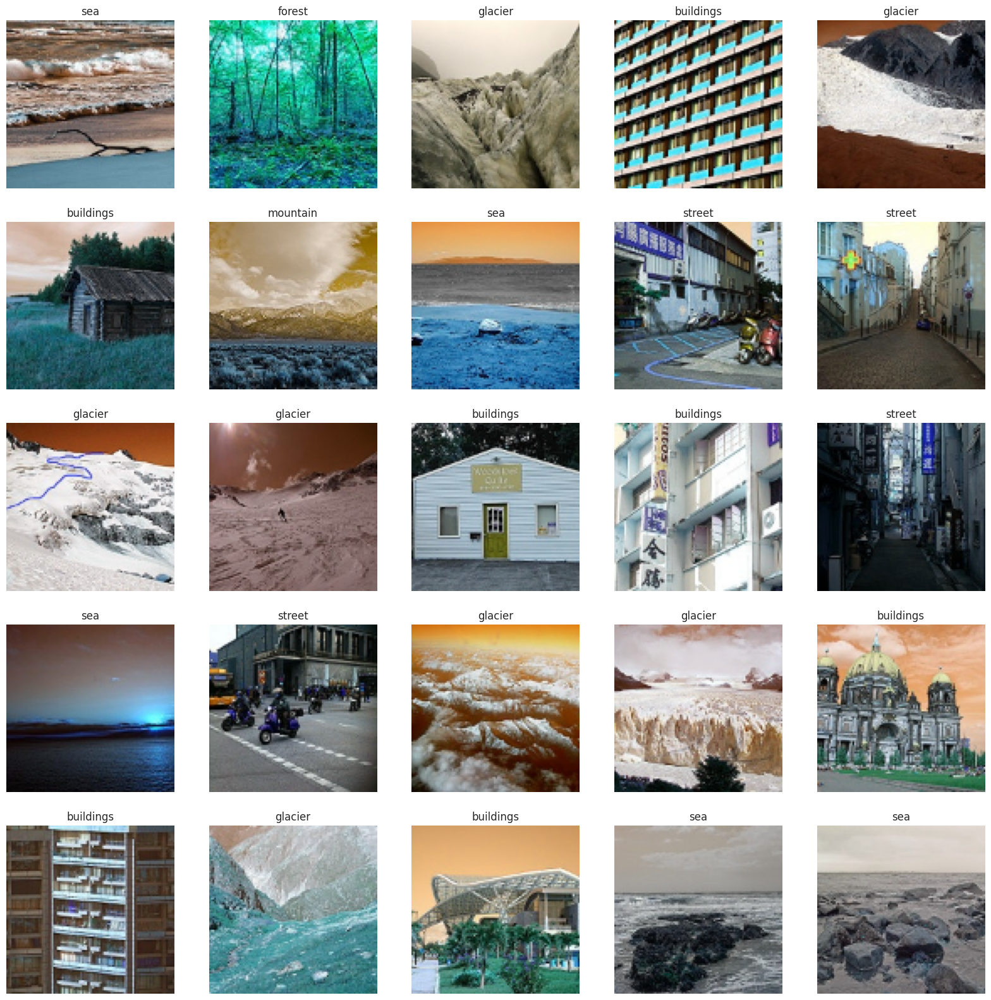

In [13]:
fig, ax = plt.subplots(nrows = 5, ncols = 5, figsize=(20, 20))
ax = ax.flatten()
i=0
for n in list(np.random.randint(0,len(X_train),25)):
    ax[i].imshow(X_train[n])
    ax[i].axis('off')
    ax[i].grid(False)
    ax[i].set_title(getcode(y_train[n]))
    i+=1


plt.show()

In [14]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])
        

In [15]:
print(len(X_test))
print(len(y_test))

3000
3000


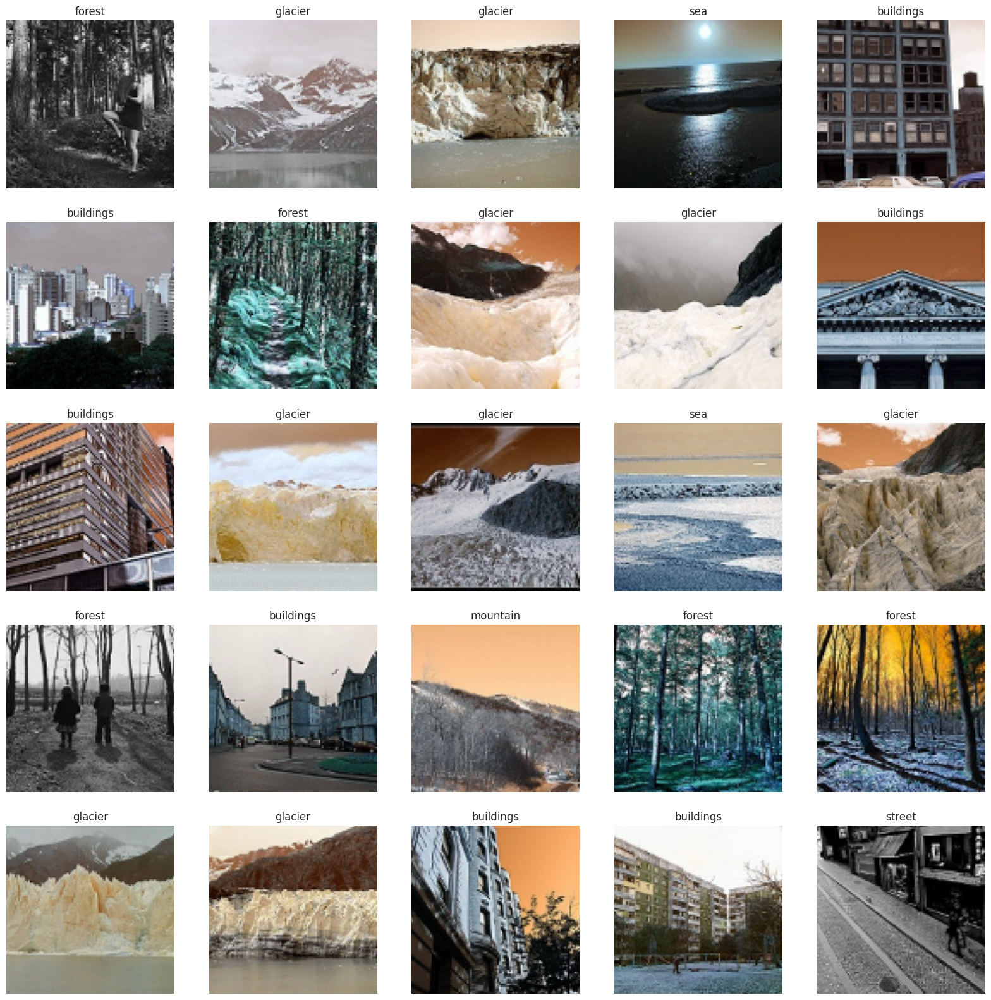

In [16]:
fig, ax = plt.subplots(nrows = 5, ncols = 5, figsize=(20, 20))
ax = ax.flatten()
i=0
for n in list(np.random.randint(0,len(X_test),25)):
    ax[i].imshow(X_test[n])
    ax[i].axis('off')
    ax[i].grid(False)
    ax[i].set_title(getcode(y_test[n]))
    i+=1


plt.show()

In [17]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))       

In [18]:
print(len(X_pred))

7301


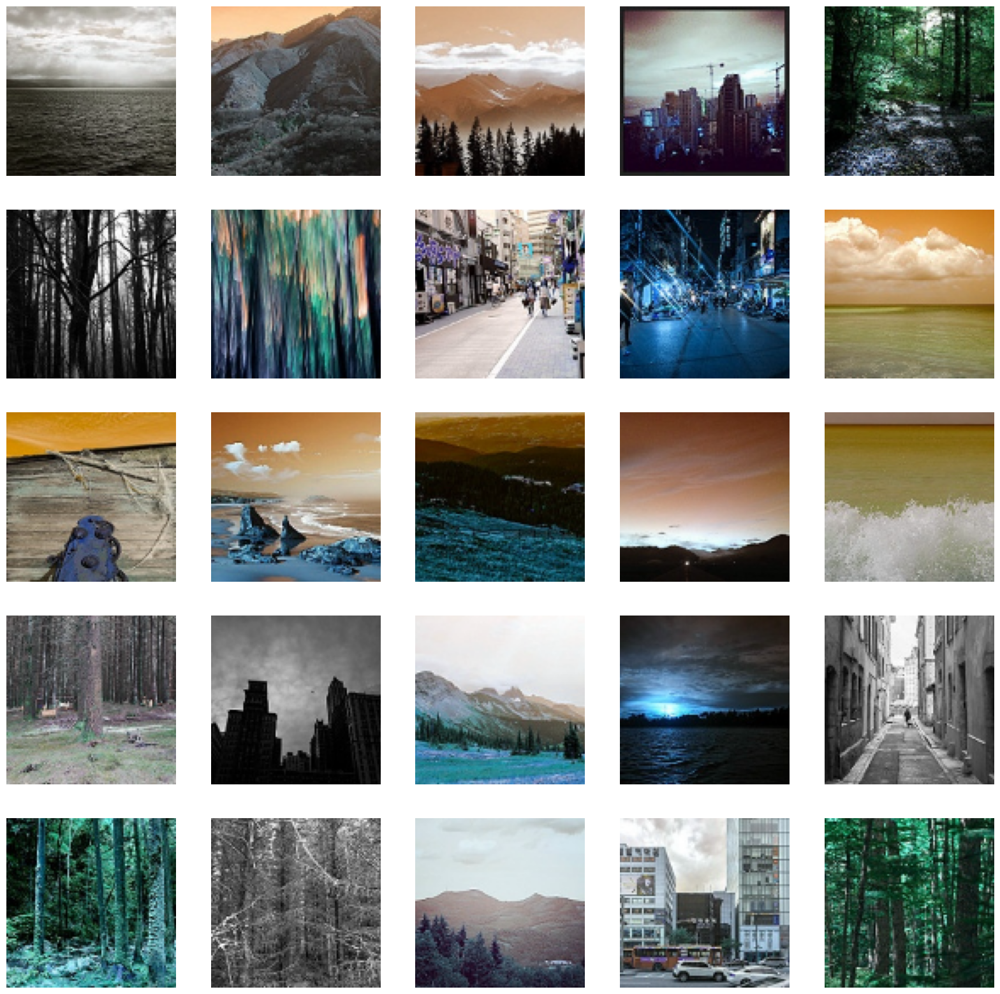

In [19]:
fig, ax = plt.subplots(nrows = 5, ncols = 5, figsize=(20, 20))
ax = ax.flatten()
i=0
for n in list(np.random.randint(0,len(X_pred),25)):
    ax[i].imshow(X_pred[n])
    ax[i].axis('off')
    ax[i].grid(False)
    i+=1


plt.show()

<div style="background-color: red; padding: 10px; border-radius: 10px; text-align: center;">
  <span style="color: white; font-size: 15px; font-weight: bold;">
      Building Model
    
   </span>
</div>



**Convert lists to numpy arrays**

In [20]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


# **Building the CNN model by Keras , using Conv2D layers , MaxPooling ,Batch Normalization & Denses**

In [21]:
KerasModel = keras.models.Sequential([
        keras.layers.Input((s,s,3)),
    
        keras.layers.Conv2D(128,kernel_size=(3,3),activation='relu'),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPool2D(pool_size=(2,2)),
    
        keras.layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPool2D(pool_size=(2,2)),
    
        keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu'),
        keras.layers.BatchNormalization(),
        keras.layers.MaxPool2D(pool_size=(2,2)),
    
      
        keras.layers.Flatten() ,   
    
       
        keras.layers.Dense(128,activation='relu') ,
        keras.layers.Dropout(rate=0.4) ,       
    
        keras.layers.Dense(6,activation='softmax') ,    
        ])

# **Compiling the model , using adam optimizer , & sparse categorical crossentropy loss**

In [22]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

# **How the model looks like ?**

In [23]:
print(KerasModel.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 128)    │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 98, 98, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 47, 47, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 21, 21, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       409,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 507,238 (1.93 MB)

 Trainable params: 506,790 (1.93 MB)

 Non-trainable params: 448 (1.75 KB)

None


# **training the model , lets use 25 epochs now**

In [24]:
epochs = 25
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=128,verbose=1)

Epoch 1/25


I0000 00:00:1728596175.832366      69 service.cc:145] XLA service 0x784b20032ee0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728596175.832431      69 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  3/110 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.1927 - loss: 3.1863 

I0000 00:00:1728596182.637098      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


110/110 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - accuracy: 0.5215 - loss: 1.4776
Epoch 2/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.7298 - loss: 0.7447
Epoch 3/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.7770 - loss: 0.6270
Epoch 4/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8041 - loss: 0.5554
Epoch 5/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8295 - loss: 0.4692
Epoch 6/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8403 - loss: 0.4362
Epoch 7/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.8576 - loss: 0.3864
Epoch 8/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8748 - loss: 0.3481
Epoch 9/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8928 - loss: 0.2903
Epoch 10/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.8978 - loss: 0.2712
Epoch 11/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.9106 - loss: 0.2409
Epoch 12/25
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/st

# **loss & accuracy**


In [25]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print(f'Test Loss is {ModelLoss}')
print(f'Test Accuracy is {ModelAccuracy}')

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7347 - loss: 1.3780
Test Loss is 1.3916963338851929
Test Accuracy is 0.7319999933242798


In [26]:
y_pred = KerasModel.predict(X_test)

print(f'Prediction Shape is {y_pred.shape}')

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Prediction Shape is (3000, 6)


In [27]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Prediction Shape is (7301, 6)


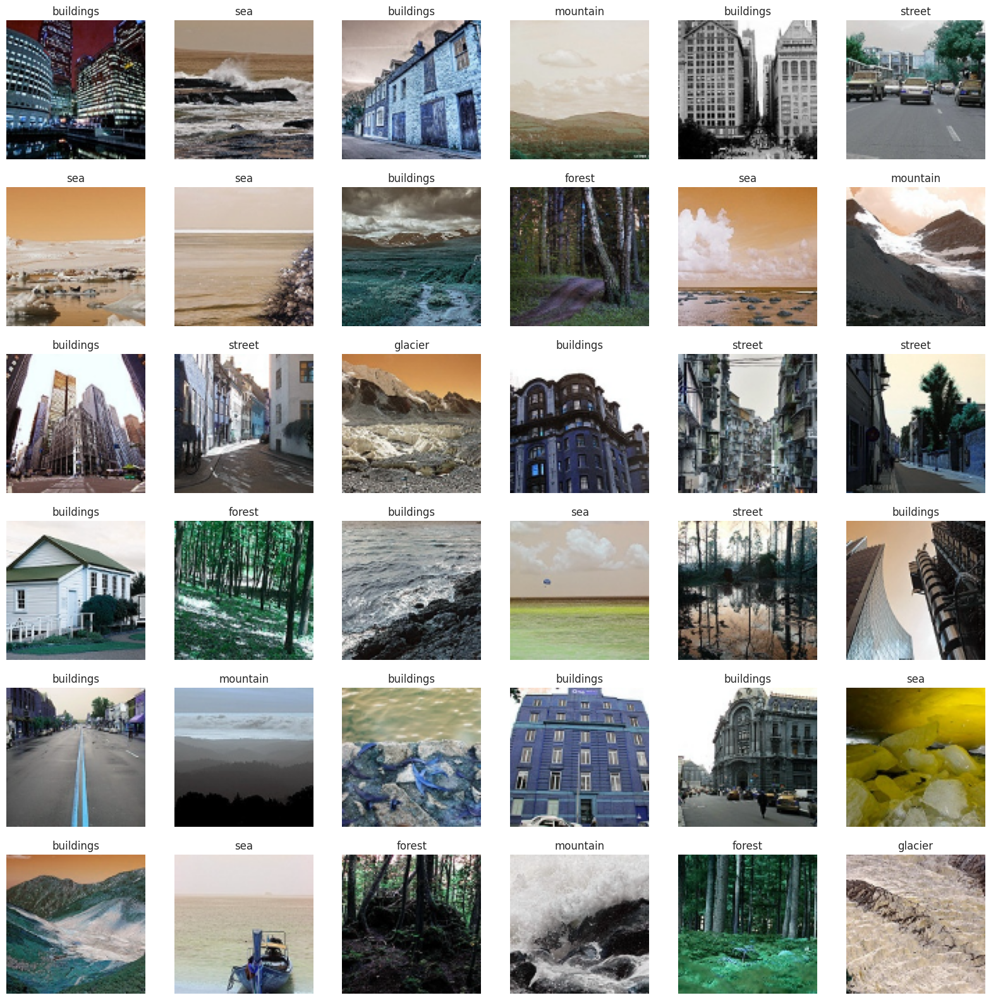

In [28]:
fig, ax = plt.subplots(nrows = 6, ncols = 6, figsize=(20, 20))
ax = ax.flatten()
i=0
for n in list(np.random.randint(0,len(X_pred),36)):
    ax[i].imshow(X_pred[n])
    ax[i].axis('off')
    ax[i].grid(False)
    ax[i].set_title(getcode(np.argmax(y_result[n])))
    i+=1


plt.show()

<div style="background-color: green; padding: 10px; border-radius: 10px; text-align: center;">
  <span style="color: white; font-size: 15px; font-weight: bold;">
      plot confusion matrix To can evaluate  Model
    
   </span>
</div>

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


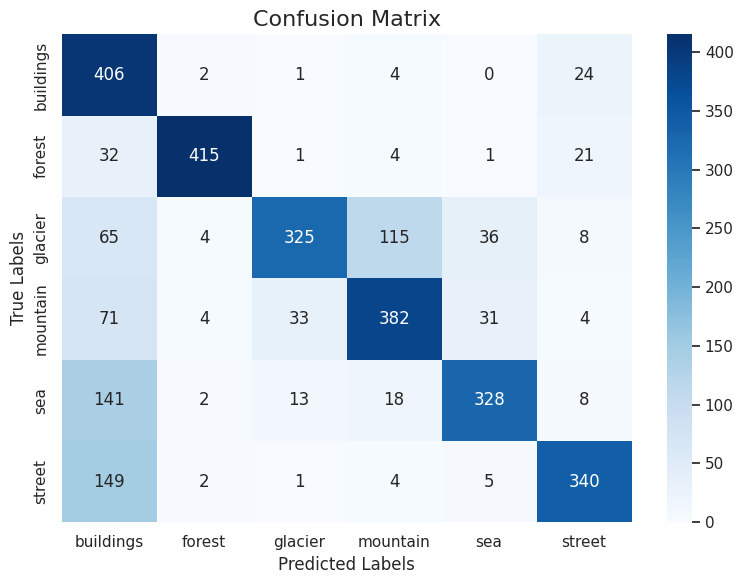

In [29]:
def plot_confusion_matrix(true_labels, pred_labels, class_names):
    
    cm = confusion_matrix(true_labels, pred_labels)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    
    plt.title("Confusion Matrix", fontsize=16)
    plt.xlabel("Predicted Labels", fontsize=12)
    plt.ylabel("True Labels", fontsize=12)
    plt.tight_layout()
    plt.show()

class_names = ['buildings','forest','glacier','mountain','sea','street' ]   
predictions = KerasModel.predict(X_test) 
pred_labels = np.argmax(predictions, axis=1)  
plot_confusion_matrix(y_test, pred_labels, class_names)